In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pydicom
import sys, os, glob
import scipy.ndimage

# helper function

In [2]:
def transform_to_hu(ct_image, slope = 1.0, intercept = -1024.0):
    '''
        Convert raw pixel to hounsfield unit 
        ct_image: np array
    '''
    new_image = ct_image.copy()
    hu_image = new_image * slope + intercept
    return hu_image

In [3]:
def cut_hounsfield_unit_wl_ww(hu_image, window_level=40, window_width=300):
    '''
        Cut HU range with value (not raw pixel_array parsing from dicom)
    '''
    new_image = hu_image.copy()
    upperbound = window_level + (window_width / 2)
    lowerbound = window_level - (window_width / 2)
    new_image[new_image > upperbound] = upperbound
    new_image[new_image < lowerbound] = lowerbound
    return new_image

In [4]:
def get_plane(image_orientation):
    '''
        image_orientation: 1x6 vector
    '''
    IOP_round = [round(x) for x in image_orientation]
    plane = np.cross(IOP_round[0:3], IOP_round[3:6])
    plane = [abs(x) for x in plane]
    if plane[0] == 1:
        return "Sagittal"
    elif plane[1] == 1:
        return "Coronal"
    elif plane[2] == 1:
        return "Axial"

In [5]:
def sorted_slice(ct_images, is_reverse = False):
    '''
        ct_images: mutiple ct images, class CT_image array
        default:
            axial: patient feet to head (z value small to big)
            coronal: patient anterior to posterior (y value small to big)
            sagittal: patient right to left (x value small to big)
        TODO:
            sort by InstanceNumber tag in dicom file
    '''
    import operator
    sorted_images = ct_images.copy()
    image_orientation = sorted_images[0].image_orientation
    if(get_plane(image_orientation) == "Axial"):
        sorted_images = sorted(sorted_images, key=lambda x : x.image_position[2], reverse=is_reverse)
    elif(get_plane(image_orientation) == "Coronal"):
        sorted_images = sorted(sorted_images, key=lambda x : x.image_position[1], reverse=is_reverse)
    elif(get_plane(image_orientation) == "Sagittal"):
        sorted_images = sorted(sorted_images, key=lambda x : x.image_position[0], reverse=is_reverse)
        
    return sorted_images

In [6]:
class CT_image():
    def __init__(self, dcm, name):
        try:
            self.dcm_name = name
            self.image = dcm.pixel_array
            # 2d -> 3d
            self.image_position = np.asarray(dcm.ImagePositionPatient).astype(np.float)
            self.pixel_spacing = np.asarray(dcm.PixelSpacing).astype(np.float)
            self.image_orientation = np.asarray(dcm.ImageOrientationPatient).astype(np.float)
            # convert to HU
            self.rescale_intercept = dcm.RescaleIntercept
            self.rescale_slope = dcm.RescaleSlope
            # WL/WW
            try:
                self.WL = dcm.WindowCenter[0]
                self.WW = dcm.WindowWidth[0]
            except:
                self.WL = dcm.WindowCenter
                self.WW = dcm.WindowWidth
            self.slice_thickness = dcm.SliceThickness
            
        except AttributeError as error:
            print(error)
        except:
            print("Unexpected error:", sys.exc_info()[0])
            raise
        
    def pixel2voxel(self, row, col):
        if(self.get_plane() == "Axial"):
            voxel = self.image_position + (-1) * np.array([1,0,0]) * float(self.pixel_spacing[0]) * col + (-1) * np.array([0,1,0])* float(self.pixel_spacing[1]) * row
            return voxel
        elif(self.get_plane() == "Coronal"):
            voxel = self.image_position + (-1) * np.array([1,0,0]) * float(self.pixel_spacing[0]) * col + (-1) * np.array([0,0,1])* float(self.pixel_spacing[1]) * row
            return voxel

In [7]:
def load_patient_data(folder_name, target_plane = "Axial"):
    dcm_files = sorted(glob.glob(os.path.join(folder_name, '*.dcm')))

    data = []
    
    for dcm_file in dcm_files:
        ds = pydicom.dcmread(dcm_file)
        try:
            temp = CT_image(ds, dcm_file)

            if(get_plane(temp.image_orientation) == target_plane):
                data.append(temp)
        except:
            print("Unexpected error:", sys.exc_info()[0])
            raise
    
    return np.array(data)

In [41]:
folder_name = "./BMD/BMD1BMD0001/"
dcm_files = sorted(glob.glob(os.path.join(folder_name, '*.dcm')))

axial = []
coronal = []
sagittal = []

for dcm_file in dcm_files:
    ds = pydicom.dcmread(dcm_file)
    try:
        temp = CT_image(ds, dcm_file)

        if(get_plane(temp.image_orientation) == "Sagittal"):
            sagittal.append(temp)
        elif(get_plane(temp.image_orientation) == "Coronal"):
            coronal.append(temp)
        elif(get_plane(temp.image_orientation) == "Axial"):
            axial.append(temp)
    except:
        print(dcm_file)
print(len(axial), len(coronal),len(sagittal))

86 60 1


# Coronal MIP

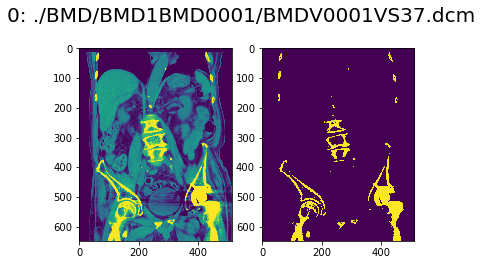

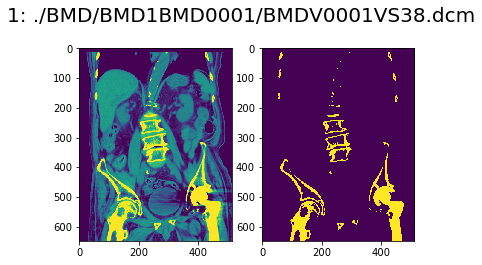

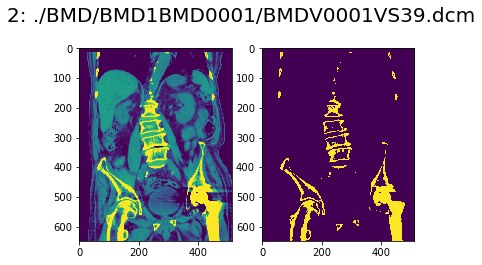

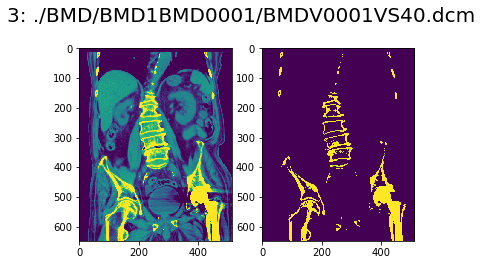

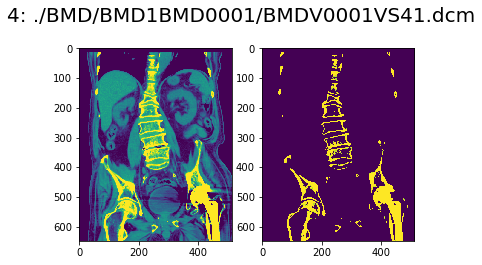

...

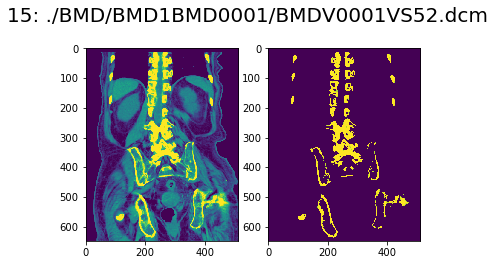

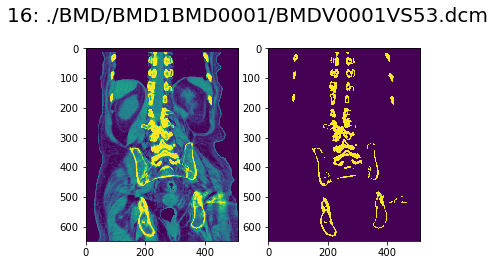

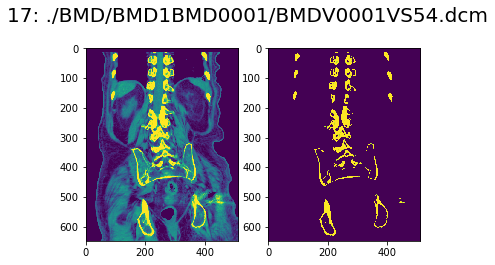

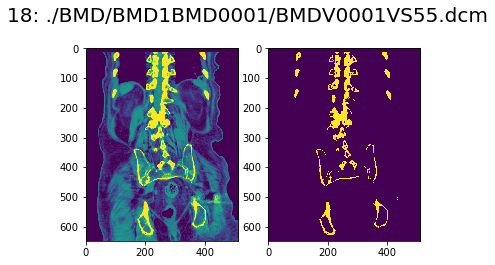

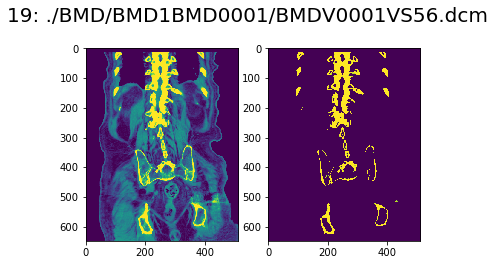

In [79]:
MIP = []
for idx, i in enumerate(coronal[35:-5]):
    hu = transform_to_hu(i.image, i.rescale_slope, i.rescale_intercept)
    new_image = cut_hounsfield_unit_wl_ww(hu, i.WL, i.WW)
    
    plt.figure()
    plt.suptitle("{}: {}".format(idx, i.dcm_name), fontsize=20)
    plt.subplot(1,2,1)
    plt.imshow(new_image)
    plt.subplot(1,2,2)
    new_image = np.where(new_image > 160, new_image, 0)
    plt.imshow(new_image)
    
    MIP.append(new_image)
    
MIP = np.array(MIP)

(648, 512)


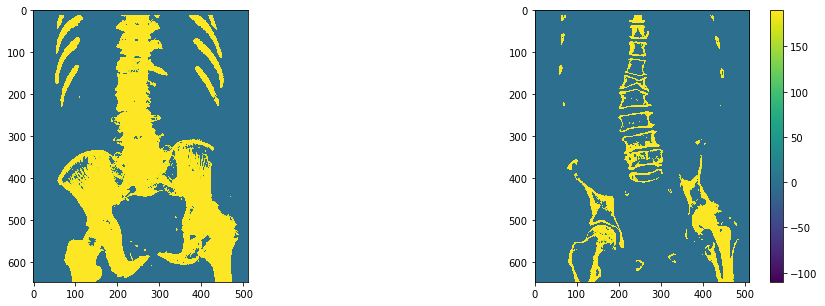

In [80]:
IM_MAX = np.max(MIP, axis=0)
print(IM_MAX.shape)
plt.figure(figsize= (16, 5))
plt.subplot(1,2,1)
plt.imshow(IM_MAX, vmax=190, vmin=-110)
plt.subplot(1,2,2)
plt.imshow(threshold_hu, vmax=190, vmin=-110)
plt.colorbar()

(648, 512)


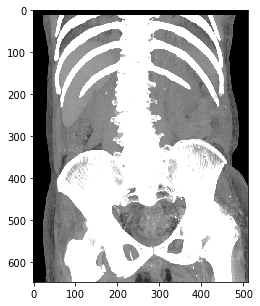

In [27]:
IM_MAX = np.max(MIP, axis=0)
print(IM_MAX.shape)
plt.figure(figsize= (16, 5))
plt.imshow(IM_MAX, cmap="gray")

# Axial Test

/Users/tsung/miniconda3/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


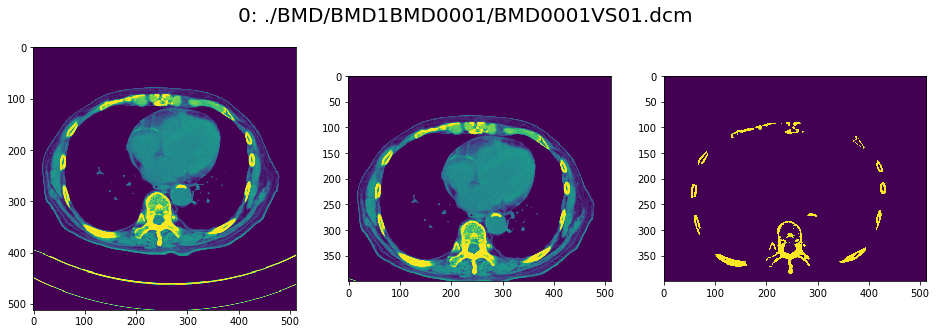

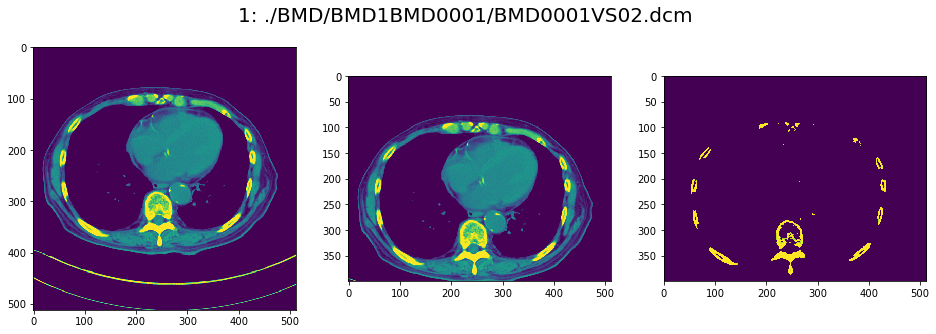

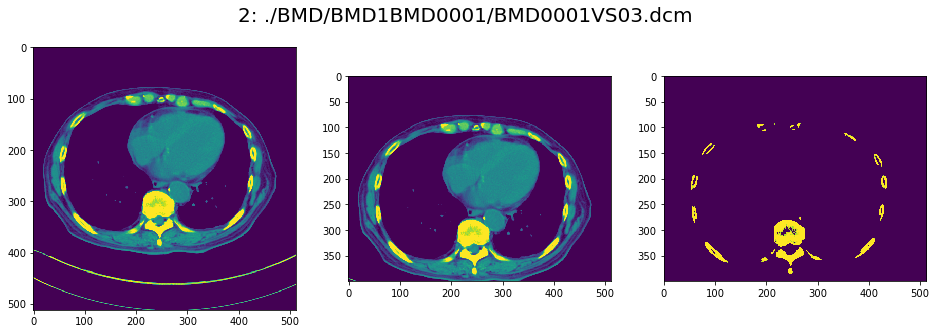

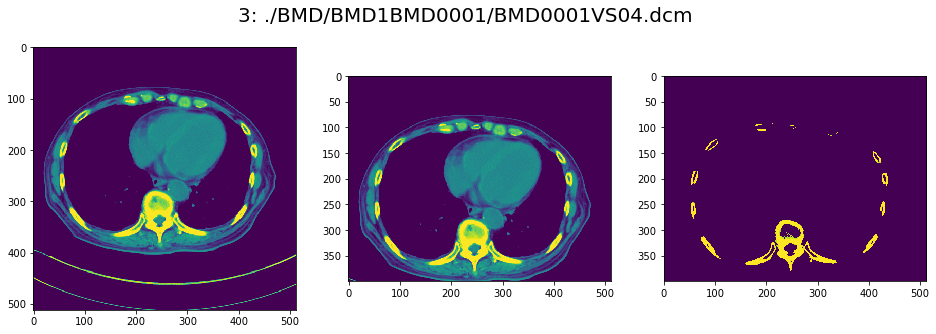

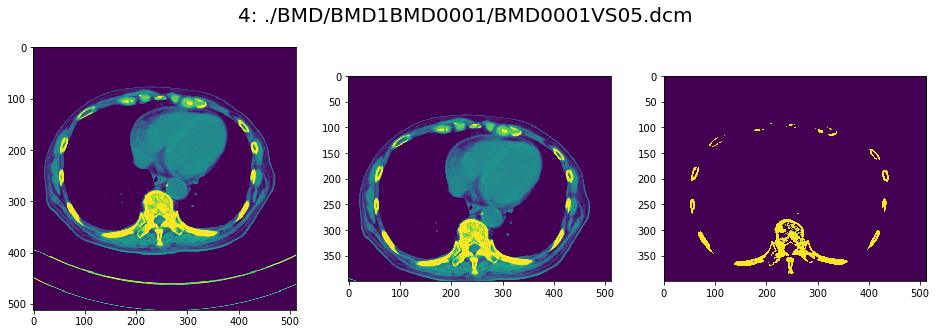

...

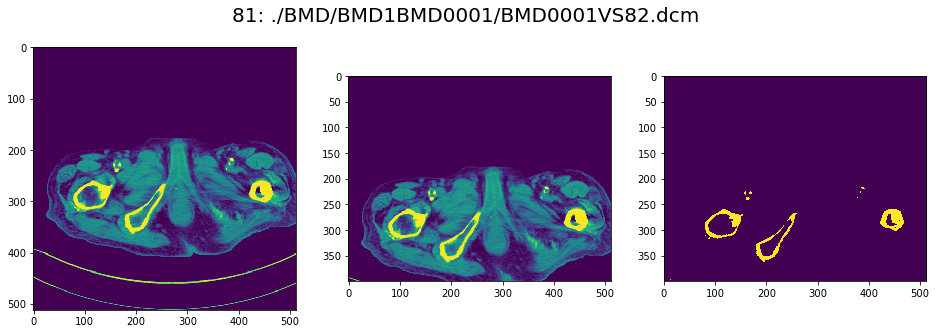

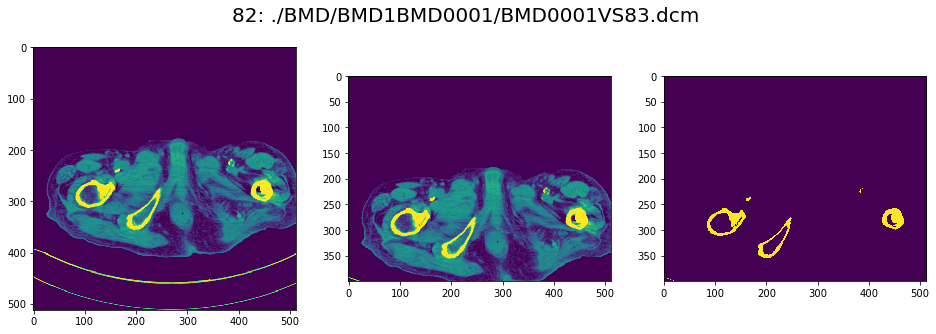

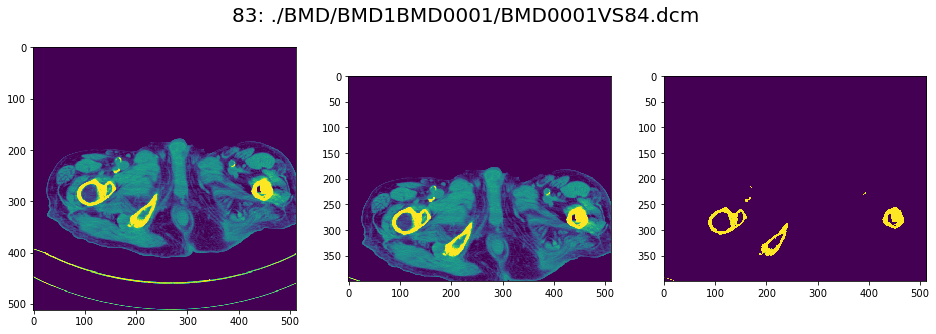

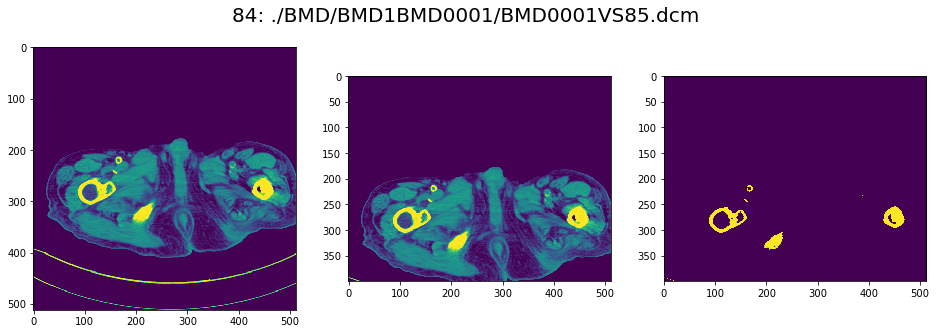

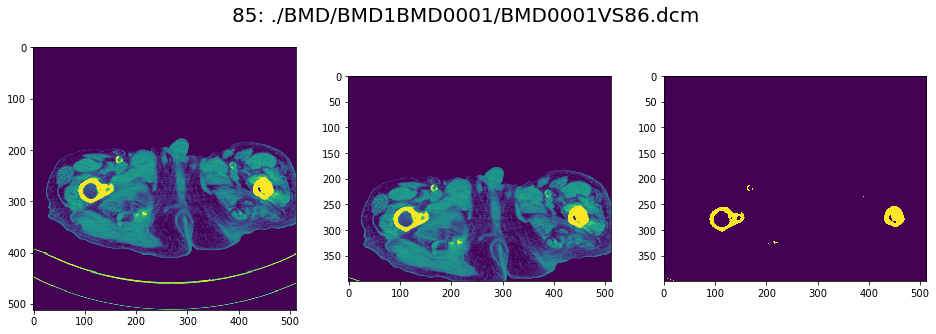

In [31]:
MIP = []
for idx, i in enumerate(axial):
    hu = transform_to_hu(i.image, i.rescale_slope, i.rescale_intercept)
    new_image = cut_hounsfield_unit_wl_ww(hu, i.WL, i.WW)
    
    plt.figure(figsize= (16, 5))
    plt.suptitle("{}: {}".format(idx, i.dcm_name), fontsize=20)
    plt.subplot(1,3,1)
    plt.imshow(new_image)
    
    plt.subplot(1,3,2)
    new_image = new_image[0:400, :]
    plt.imshow(new_image)
    
    plt.subplot(1,3,3)
    threshold_hu = np.where(new_image > 160, new_image, 0)
    plt.imshow(threshold_hu)
    
    MIP.append(new_image)
    
    
MIP = np.array(MIP)

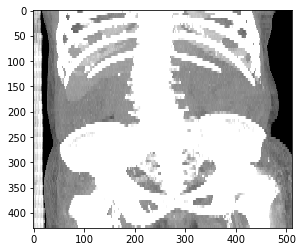

In [83]:
IM_MAX = np.max(MIP, axis=1)
temp = np.repeat(IM_MAX, axial[0].slice_thickness, axis=0)
plt.imshow(temp, cmap="gray")

## web https://www.raddq.com/dicom-processing-segmentation-visualization-in-python/

In [13]:
axial = load_patient_data("./BMD/BMD1BMD0001/", "Axial")

In [9]:
axial = sorted_slice(axial, is_reverse=True)

In [10]:
axial_images = []
hu_images = []
for i in axial:
    hu = transform_to_hu(i.image, i.rescale_slope, i.rescale_intercept)
    
    axial_images.append(i.image)
    hu_images.append(hu)
    
axial_images = np.array(axial_images)
hu_images = np.array(hu_images)
print(axial_images.shape, hu_images.shape)

(86, 512, 512) (86, 512, 512)


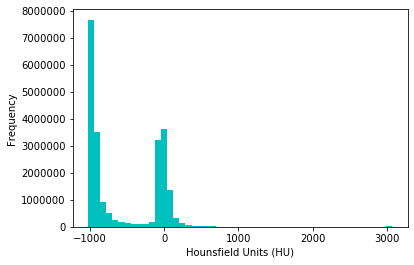

In [13]:
plt.hist(hu_images.flatten(), bins=50, color='c')
plt.xlabel("Hounsfield Units (HU)")
plt.ylabel("Frequency")
plt.show()

In [18]:
def sample_stack(stack, rows=6, cols=6, start_with=10, show_every=1):
    fig,ax = plt.subplots(rows,cols,figsize=[12,12])
    for i in range(rows*cols):
        ind = start_with + i*show_every
        ax[int(i/rows),int(i % rows)].set_title('slice %d' % ind)
        ax[int(i/rows),int(i % rows)].imshow(stack[ind],cmap='gray')
        ax[int(i/rows),int(i % rows)].axis('off')
    plt.show()

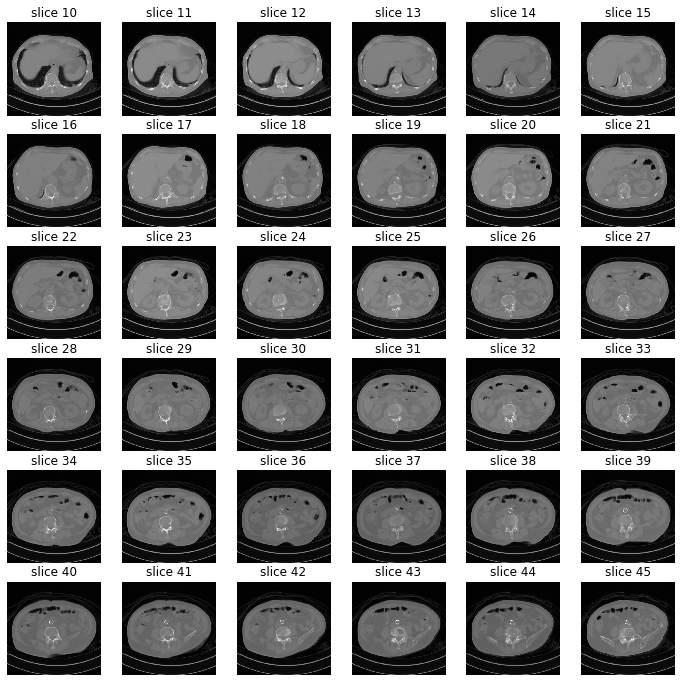

In [15]:
sample_stack(axial_images)

In [55]:
def resample(image, scan, new_spacing=[1,1,1]):
    # Determine current pixel spacing
    slice_thickness = np.array([scan[0].slice_thickness]).astype(np.float)
    pixel_spacing = scan[0].pixel_spacing
    spacing = np.concatenate((slice_thickness, pixel_spacing), axis=0)
    
    resize_factor = spacing / new_spacing
    new_real_shape = image.shape * resize_factor
    new_shape = np.round(new_real_shape)
    real_resize_factor = new_shape / image.shape
    new_spacing = spacing / real_resize_factor
    
    print("start")
    image = scipy.ndimage.interpolation.zoom(image, real_resize_factor)
    print("end")
    return image, new_spacing

In [56]:
print("before: ", axial_images.shape)
after_images, spacing = resample(axial_images, axial, [1,1,1])
print("after: ", after_images.shape)

before:  (86, 512, 512)
start
end
start
end
after:  (430, 347, 347)


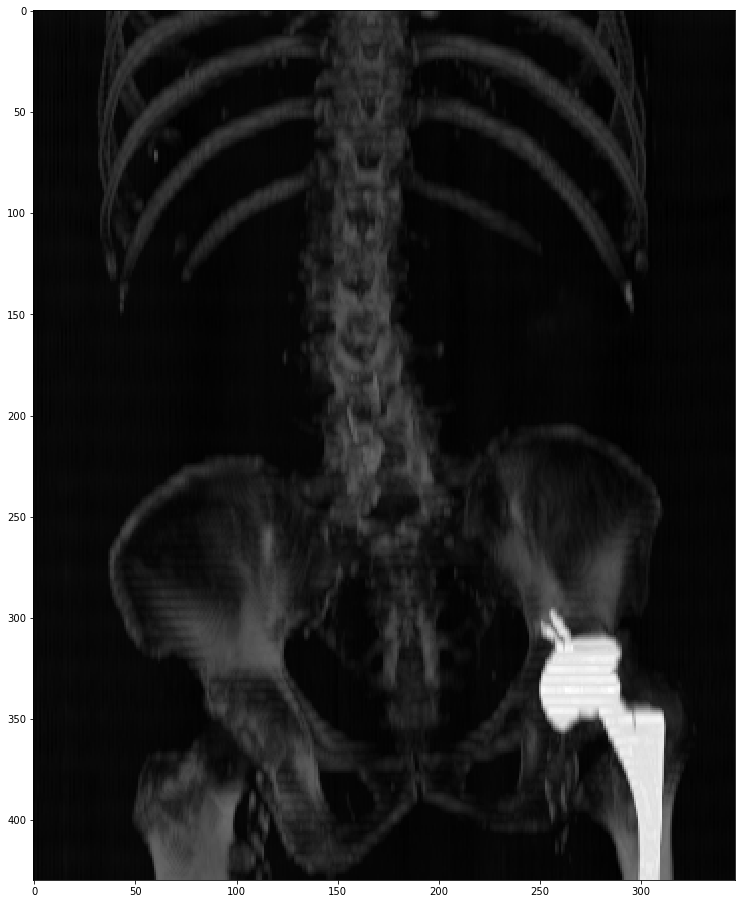

In [59]:
IM_MAX = np.max(after_images, axis=1)
plt.figure(figsize=(16,16))
plt.imshow(IM_MAX, cmap="gray")

# test2

In [9]:
coronal = load_patient_data("./BMD/BMD1BMD0001/", "Coronal")

In [10]:
coronal = sorted_slice(coronal)

In [11]:
def test(ct_images):
    images = []
    hu_images = []
    for i in ct_images:
        hu = transform_to_hu(i.image, i.rescale_slope, i.rescale_intercept)

        images.append(i.image)
        hu_images.append(hu)

    return np.array(images), np.array(hu_images)

In [12]:
images, hu_images = test(coronal)

In [16]:
def plt_hu_hist(hu_images):
    plt.hist(hu_images.flatten(), bins=50, color='c')
    plt.xlabel("Hounsfield Units (HU)")
    plt.ylabel("Frequency")
    plt.show()

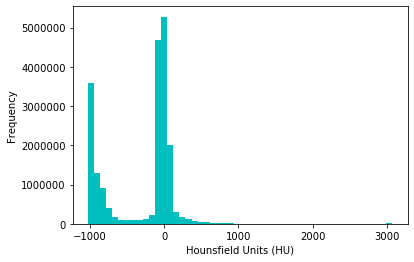

In [17]:
plt_hu_hist(hu_images)

In [20]:
def resample(image, scan, new_spacing=[1,1,1]):
    # Determine current pixel spacing
    slice_thickness = np.array([scan[0].slice_thickness]).astype(np.float)
    pixel_spacing = scan[0].pixel_spacing
    spacing = np.concatenate((slice_thickness, pixel_spacing), axis=0)
    
    resize_factor = spacing / new_spacing
    new_real_shape = image.shape * resize_factor
    new_shape = np.round(new_real_shape)
    real_resize_factor = new_shape / image.shape
    new_spacing = spacing / real_resize_factor
    
    print("start")
    image = scipy.ndimage.interpolation.zoom(image, real_resize_factor)
    print("end")
    return image, new_spacing

In [21]:
print("before: ", images.shape)
after_images, spacing = resample(images, coronal, [1,1,1])
print("after: ", after_images.shape)

before:  (60, 648, 512)
start
end
after:  (180, 439, 347)


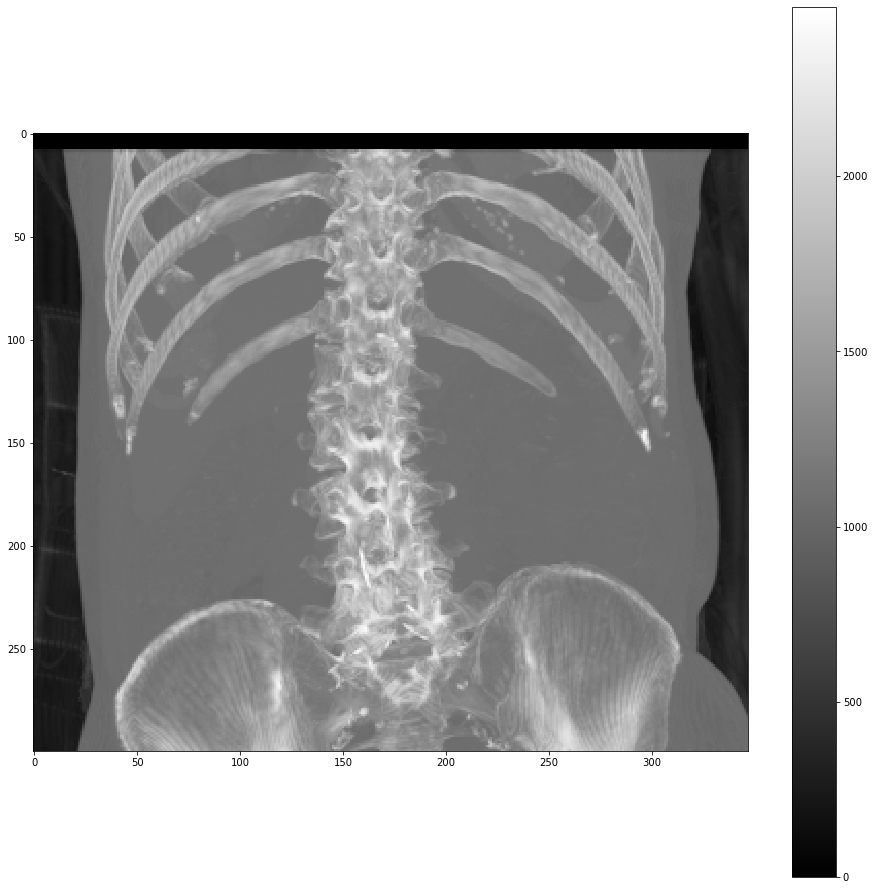

In [25]:
IM_MAX = np.max(after_images, axis=0)
plt.figure(figsize=(16,16))
plt.imshow(IM_MAX[0:300,:], cmap="gray")
plt.colorbar()

In [26]:
print("before: ", hu_images.shape)
after_images, spacing = resample(hu_images, coronal, [1,1,1])
print("after: ", after_images.shape)

before:  (60, 648, 512)
start
end
after:  (180, 439, 347)


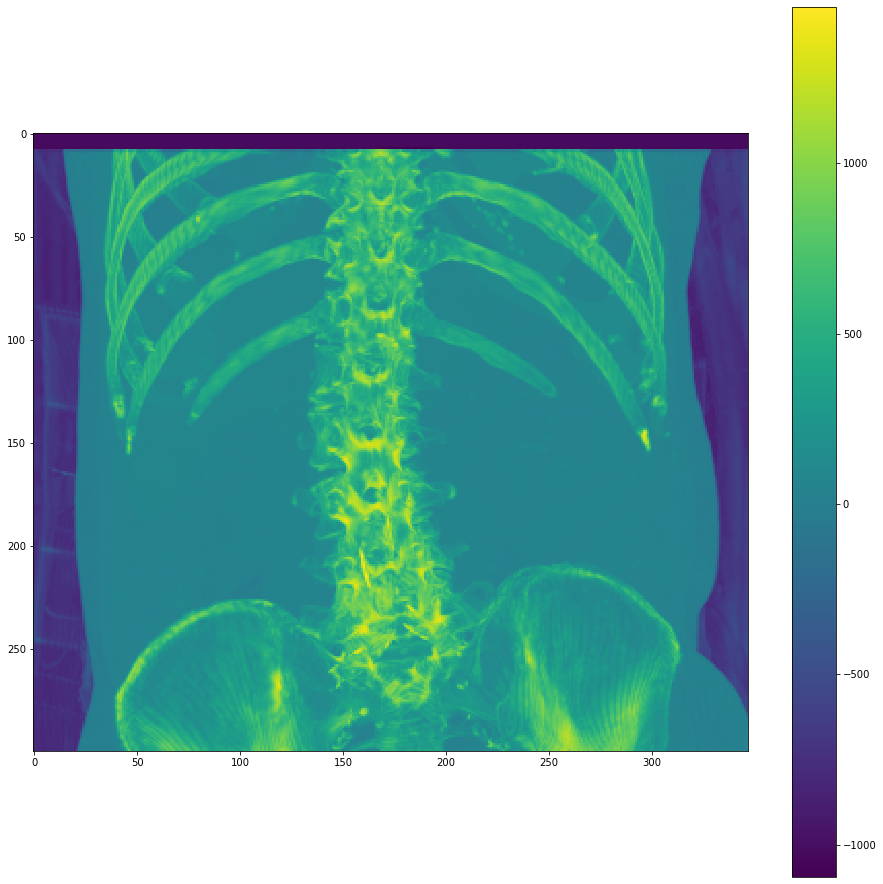

In [52]:
IM_MAX = np.max(after_images, axis=0)
plt.figure(figsize=(16,16))
plt.imshow(IM_MAX[:300, :])
plt.colorbar()

In [53]:
cancellous_bone = np.where(np.logical_and(IM_MAX >= 300, IM_MAX <= 400), IM_MAX, 0)
cortical_bone = np.where(np.logical_and(IM_MAX >= 1800, IM_MAX <= 1900), IM_MAX, 0)
wiki_bone = cancellous_bone + cortical_bone

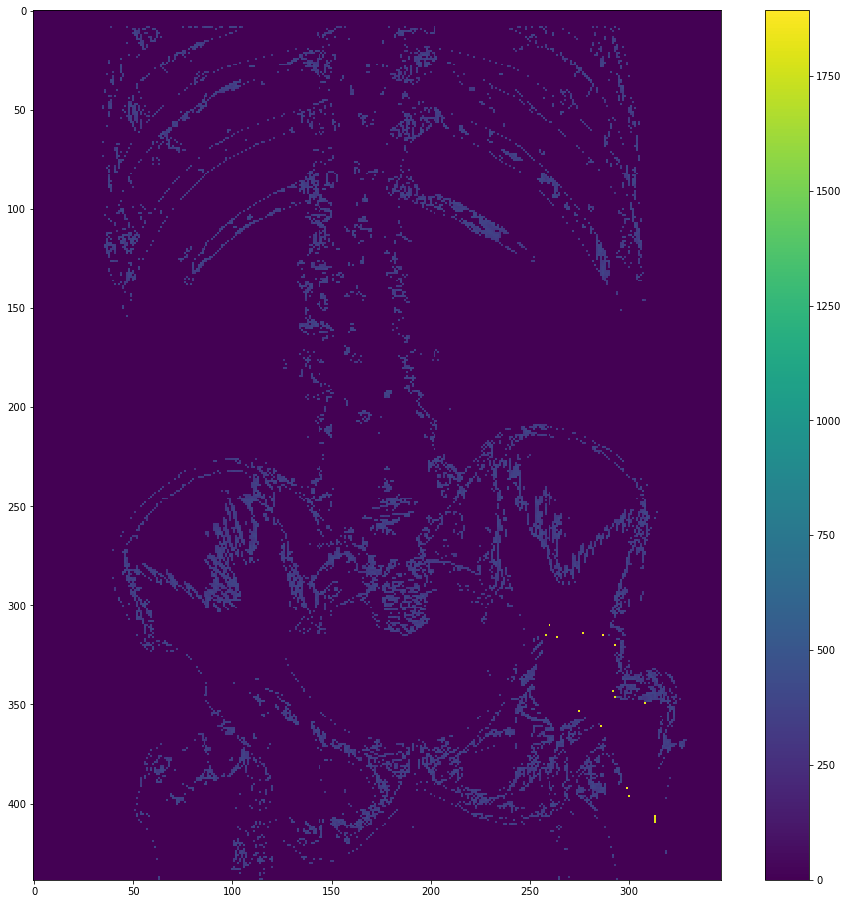

In [66]:
plt.figure(figsize=(16,16))
plt.imshow(wiki_bone)
plt.colorbar()

In [63]:
bone = np.where(np.logical_and(IM_MAX >= 700, IM_MAX < 1800), IM_MAX, 0)

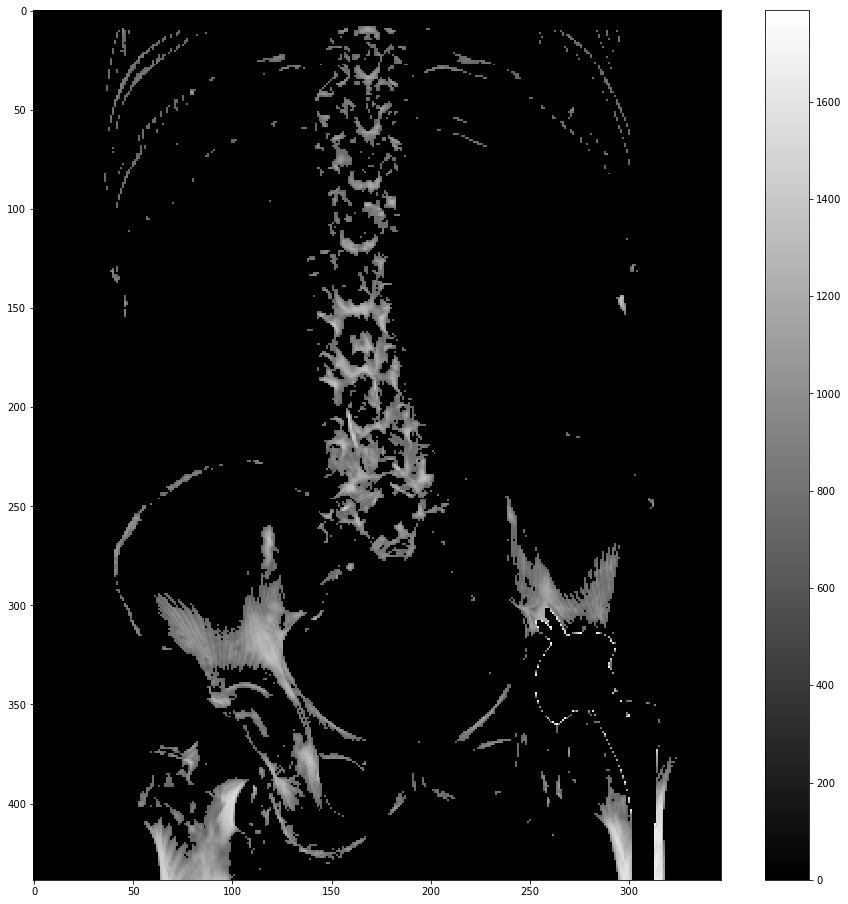

In [64]:
plt.figure(figsize=(16,16))
plt.imshow(bone, cmap="gray")
plt.colorbar()

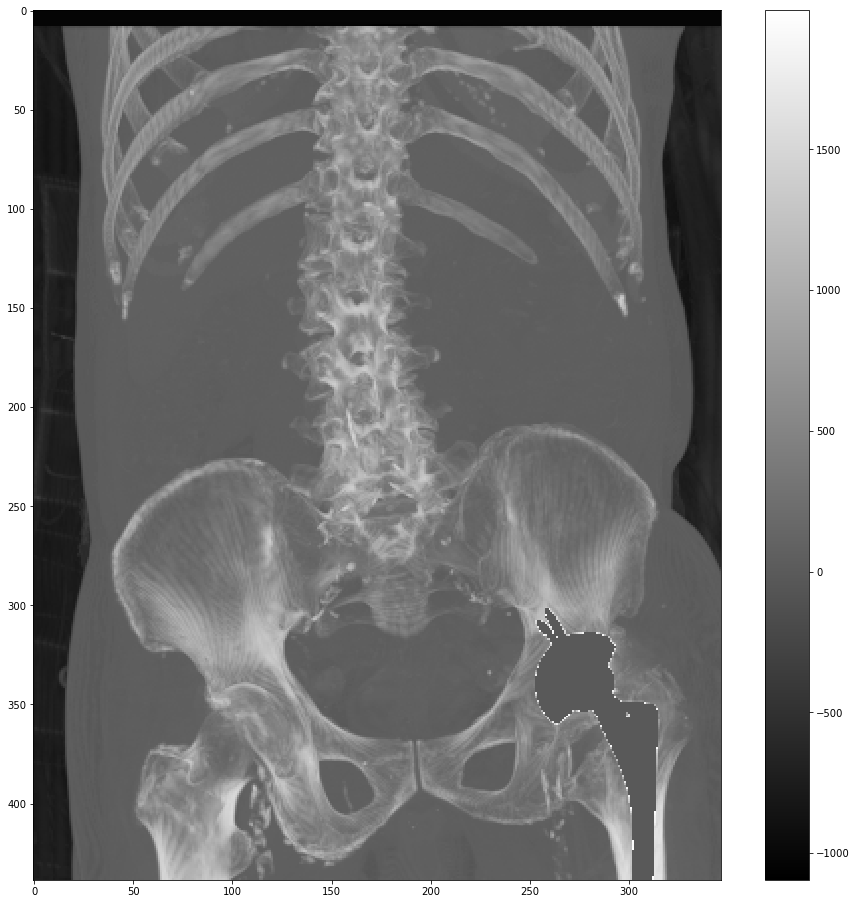

In [68]:
bone = np.where(IM_MAX <= 2000, IM_MAX, 0)
plt.figure(figsize=(16,16))
plt.imshow(bone, cmap="gray")
plt.colorbar()